In [2]:
!pip install -Uq diffusers transformers fastcore

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 42.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.2/7.2 MB 79.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 236.8/236.8 kB 23.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 117.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 77.2 MB/s eta 0:00:00


In [3]:
import logging
from pathlib import Path

import matplotlib.pyplot as plt
import torch
from diffusers import StableDiffusionPipeline
from fastcore.all import concat
from huggingface_hub import notebook_login
from PIL import Image
import numpy as np

logging.disable(logging.WARNING)

torch.manual_seed(1)
if not (Path.home()/'.huggingface'/'token').exists(): notebook_login()

The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

In [4]:
from diffusers import StableDiffusionInpaintPipeline, StableDiffusionPipeline
from fastdownload import FastDownload

In [5]:
def image_grid(imgs, rows, cols):
    w,h = imgs[0].size
    grid = Image.new('RGB', size=(cols*w, rows*h))
    for i, img in enumerate(imgs): grid.paste(img, box=(i%cols*w, i//cols*h))
    return grid

In [6]:
pipe = StableDiffusionInpaintPipeline.from_pretrained("CompVis/stable-diffusion-v1-4", revision="fp16", torch_dtype=torch.float16).to("cuda")

Fetching 16 files:   0%|          | 0/16 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/diffusers/pipelines/pipeline_utils.py:969: FutureWarning: You are using a legacy checkpoint for inpainting with Stable Diffusion, therefore we are loading the <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion_inpaint_legacy.StableDiffusionInpaintPipelineLegacy'> class instead of <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion_inpaint.StableDiffusionInpaintPipeline'>. For better inpainting results, we strongly suggest using Stable Diffusion's official inpainting checkpoint: https://huggingface.co/runwayml/stable-diffusion-inpainting instead or adapting your checkpoint CompVis/stable-diffusion-v1-4 to the format of https://huggingface.co/runwayml/stable-diffusion-inpainting. Note that we do not actively maintain the {StableDiffusionInpaintPipelineLegacy} class and will likely remove it in version 1.0.0.
  deprecate("StableDiffusionInpaintPipelineLegacy", "1.0.0", deprecation_message, standard_warn=False)


In [7]:
embeds_url = "sample_data/learned_embeds.bin"
embeds_dict = torch.load(str(embeds_url), map_location="cpu")

tokenizer = pipe.tokenizer
text_encoder = pipe.text_encoder
new_token, embeds = next(iter(embeds_dict.items()))
embeds = embeds.to(text_encoder.dtype)

assert tokenizer.add_tokens(new_token) == 1, "The token already exists!"

text_encoder.resize_token_embeddings(len(tokenizer))
new_token_id = tokenizer.convert_tokens_to_ids(new_token)
text_encoder.get_input_embeddings().weight.data[new_token_id] = embeds

In [8]:
pipe2 = StableDiffusionPipeline.from_pretrained("CompVis/stable-diffusion-v1-4", revision="fp16", torch_dtype=torch.float16).to("cuda")

In [9]:
embeds_url = "sample_data/learned_embeds.bin"
embeds_dict = torch.load(str(embeds_url), map_location="cpu")

tokenizer = pipe2.tokenizer
text_encoder = pipe2.text_encoder
new_token, embeds = next(iter(embeds_dict.items()))
embeds = embeds.to(text_encoder.dtype)

assert tokenizer.add_tokens(new_token) == 1, "The token already exists!"

text_encoder.resize_token_embeddings(len(tokenizer))
new_token_id = tokenizer.convert_tokens_to_ids(new_token)
text_encoder.get_input_embeddings().weight.data[new_token_id] = embeds

  0%|          | 0/50 [00:00<?, ?it/s]

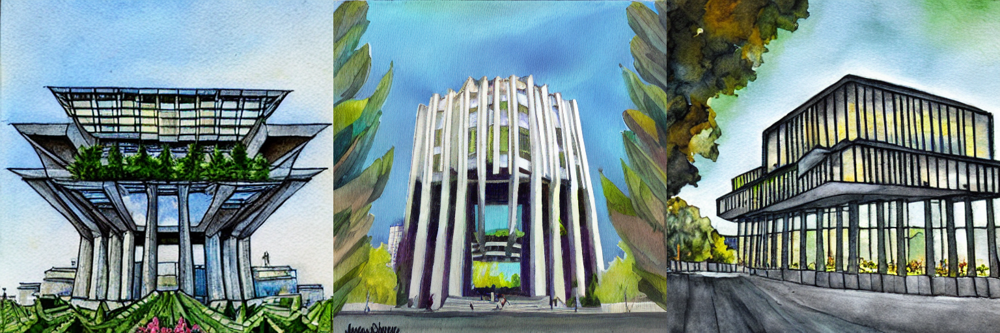

In [10]:
torch.manual_seed(20)
prompt = "Geisel Library in water color"
images = pipe2(prompt=prompt, num_images_per_prompt=3, num_inference_steps=50).images
image_grid(images, rows=1, cols=3)

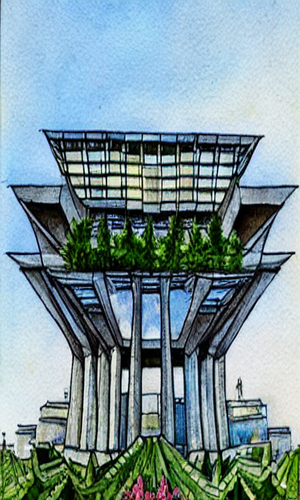

In [11]:
img = images[0].resize((300,500),Image.LANCZOS)
img

In [14]:
img_array = np.array(img)
img_array.shape

(500, 300, 3)

In [15]:
new_img = np.pad(img_array, ((0,0), (0,200), (0,0)), mode = 'edge')
new_img.shape

(500, 500, 3)

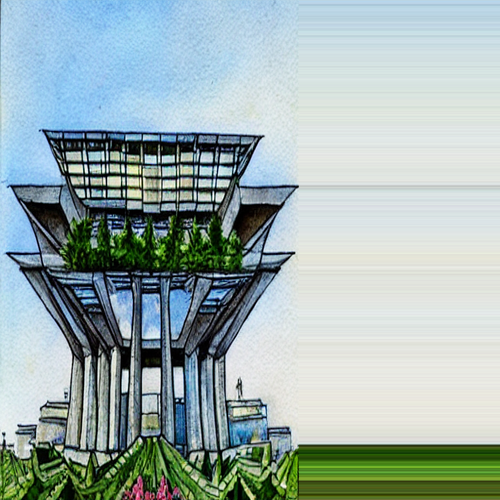

In [17]:
new_img = Image.fromarray(new_img)
new_img

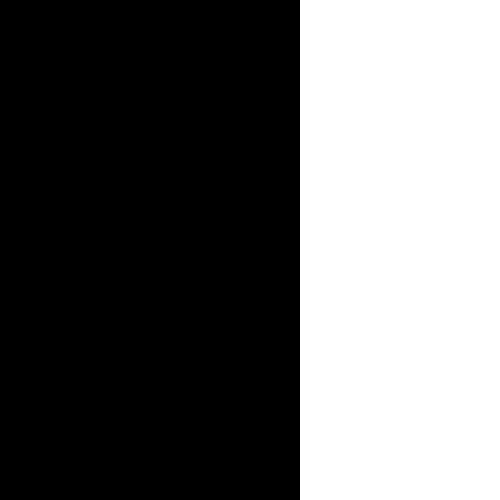

In [18]:
mask_img = np.zeros((500,500,3), dtype = np.uint8)
mask_img[:,300:,:] = 255
mask_img = Image.fromarray(mask_img)
mask_img

  0%|          | 0/40 [00:00<?, ?it/s]

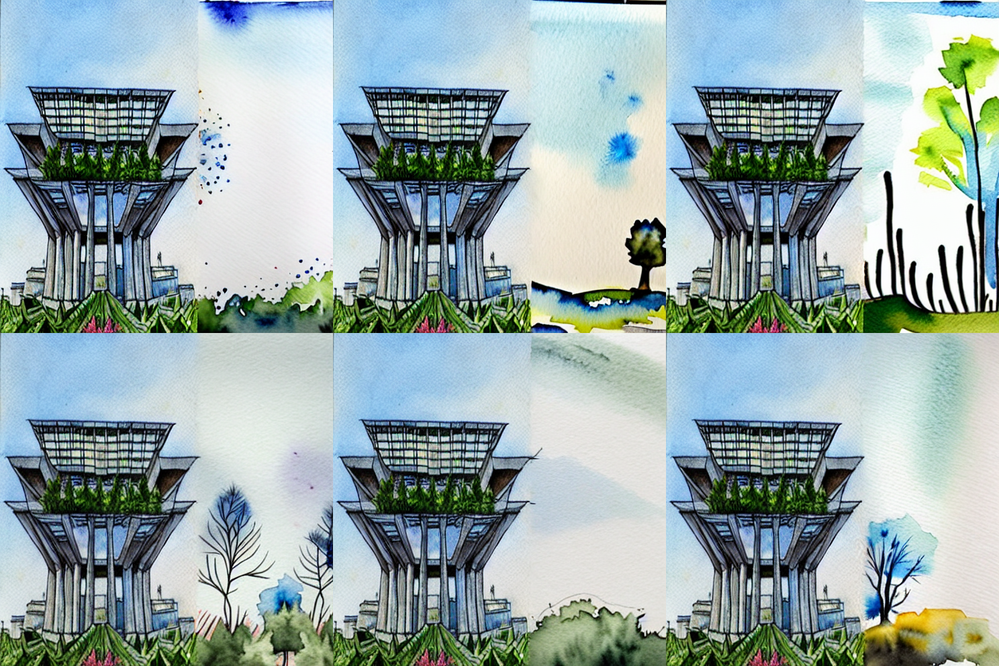

In [19]:
torch.manual_seed(1000)
prompt = "Trees and dark blue sky”"
gen_images = pipe(prompt=prompt, num_images_per_prompt=6, image=new_img, mask_image = mask_img, guidance_scale = 20, num_inference_steps=50).images
image_grid(gen_images, rows=2, cols=3)

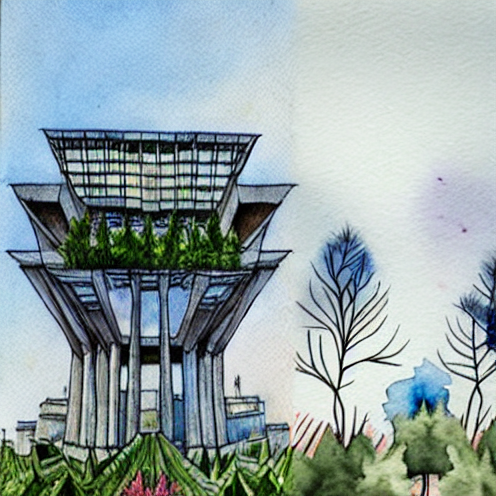

In [20]:
i = gen_images[3]
i

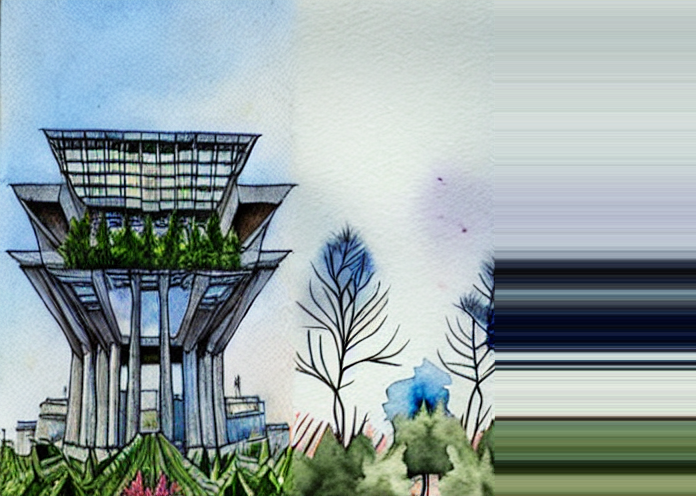

In [21]:
img_array = np.array(i)
new_img = np.pad(img_array, ((0,0), (0,200), (0,0)), mode = 'edge')
new_img = Image.fromarray(new_img)
new_img

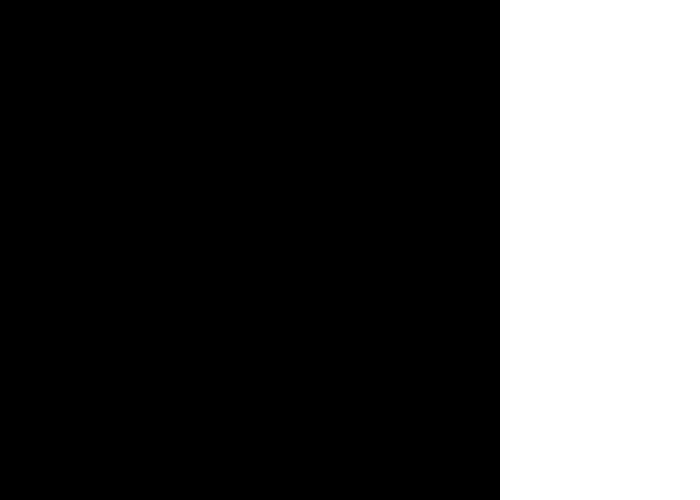

In [22]:
mask_img = np.zeros((500,700,3), dtype = np.uint8)
mask_img[:,500:,:] = 255
mask_img = Image.fromarray(mask_img)
mask_img

  0%|          | 0/40 [00:00<?, ?it/s]

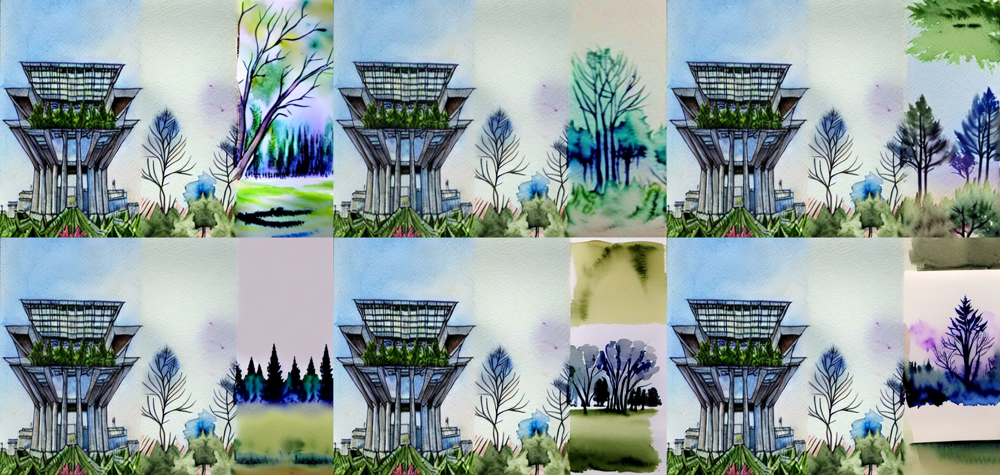

In [23]:
torch.manual_seed(1000)
prompt = "More Green Trees"
gen_images = pipe(prompt=prompt, num_images_per_prompt=6, image=new_img, mask_image = mask_img, guidance_scale = 20, num_inference_steps=50).images
image_grid(gen_images, rows=2, cols=3)

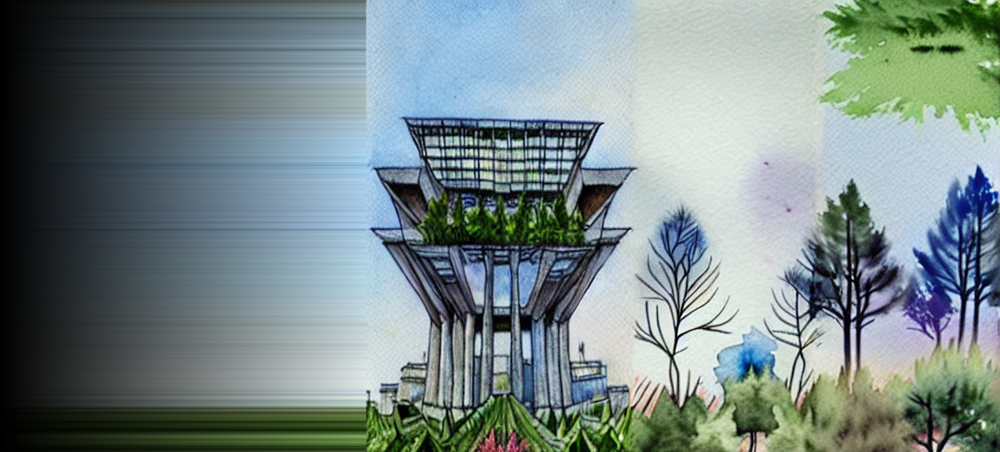

In [24]:
img_array = np.array(gen_images[2])
new_img = np.pad(img_array, ((0,0), (400,0), (0,0)), mode = 'linear_ramp')
#new_img[:,0:400,:]
new_img = Image.fromarray(new_img)
new_img

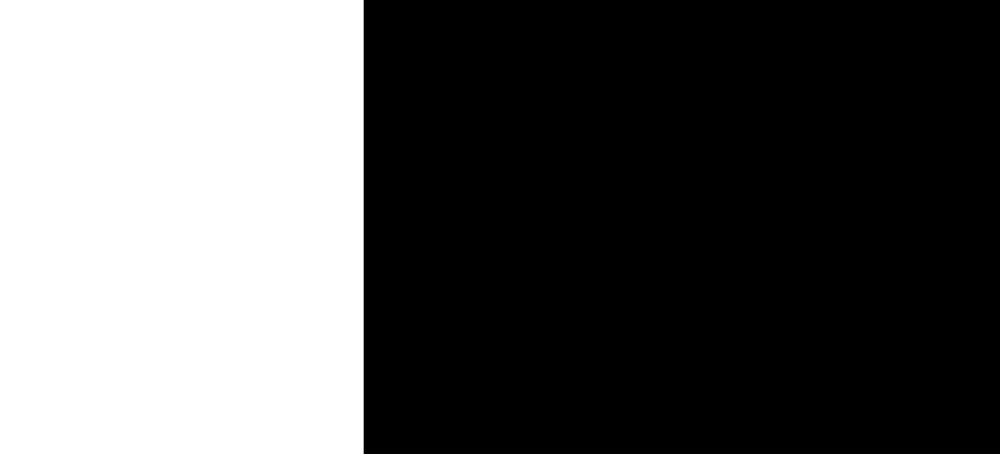

In [25]:
mask_img = np.zeros((500,1100,3), dtype = np.uint8)
mask_img[:,0:400,:] = 255
mask_img = Image.fromarray(mask_img)
mask_img

  0%|          | 0/40 [00:00<?, ?it/s]

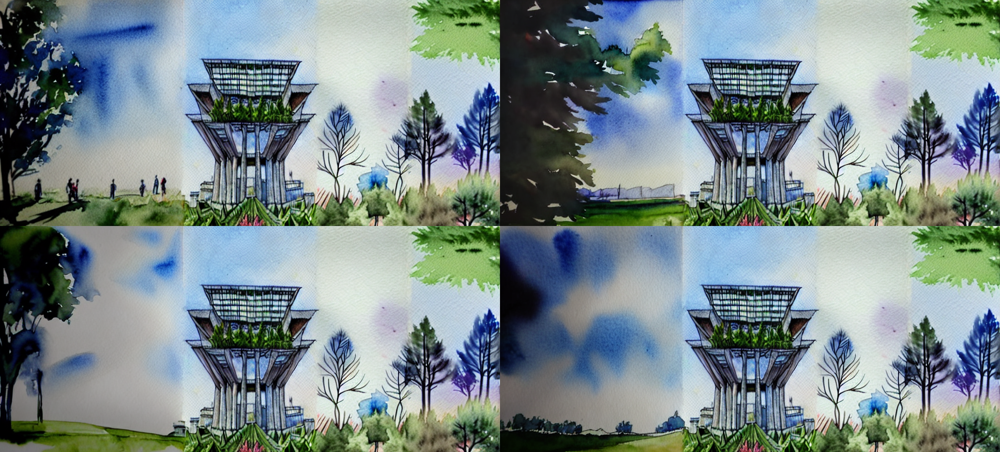

In [26]:
torch.manual_seed(10)
prompt = "Few people on the grass and blue sky"
gen_images = pipe(prompt=prompt, num_images_per_prompt=4, image=new_img, mask_image = mask_img, guidance_scale = 20, num_inference_steps=50).images
image_grid(gen_images, rows=2, cols=2)

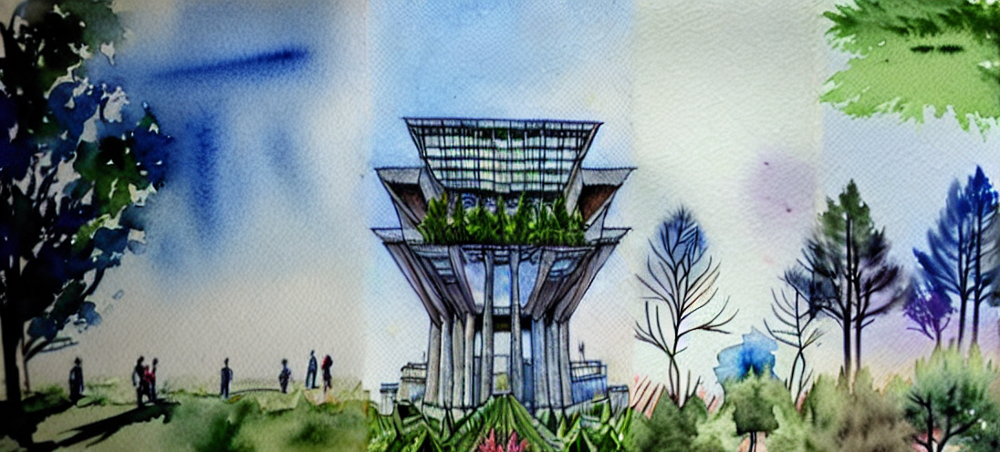

In [27]:
gen_images[0]